In [23]:
%matplotlib inline

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation,rc
from IPython.display import HTML
plt.rcParams["animation.html"] = "jshtml"

# Global parameters

In [2]:
# Number of episodes
train_episodes=5000
# Number of steps per episode
steps=100
# Window with positive Reward
min_pixel=60
max_pixel=100

# learning rate
lr=0.8
# discount factor
gamma=0.9

# Max Distance in pixels the line move between two observations
max_bend=12
# Maximal distance line moves by steering
max_steer=10

# Functions

In [3]:
class enviroment:
    """This is my environment"""
    def __init__(self):
        self.state=np.array([80])
        self.count=0
        self.dir=np.random.choice([-1,1])*max_bend
        self.turn_speed=np.random.rand()
        self.reward=[]
        self.running=True
        
    def take_step(self,angle):
        # We add random integer for street curves
        if self.count<20:    
            self.count+=1
        else:
            self.count=0
            self.dir=np.random.choice([-1,1])*max_bend
            self.turn_speed=np.random.rand()
        direction=self.dir*self.turn_speed
        self.state[0]+=int(direction-angle*max_steer)
        if min_pixel<self.state[0]<max_pixel:
            self.reward+=[1]
        else:
            self.reward+=[-100]
            self.running=False
            
    
    def reset(self):
        self.state=np.array([80])
        self.count=0
        self.dir=np.random.choice([-1,1])*max_bend
        self.turn_speed=np.random.rand()
        self.reward=[]
        self.running=True

In [4]:
class agent:
    """This is the agent making decisions"""
    def __init__(self):
        self.steer_angle=0

In [5]:
class det_agent(agent):       
    def act(self,pos):
        if pos<80:
            self.steer_angle=-1
        elif pos>80:
            self.steer_angle=1
        else:
            self.steer_angle=0
        return self.steer_angle

In [6]:
def Action_from_Qtab(Q,reverse=False):
    if not reverse:
        return 0.5*Q-1
    else:
        return int(2*Q+2)

In [7]:
def State_from_Qtab(val,reverse=False):
    if not reverse:
        return val-min_pixel-1
    else:
        return val+min_pixel+1

In [8]:
class RL_agent(agent):
    def __init__(self):
        self.steer_angle=0
        # setting initial values to action two (driving straight)
        self.Q_table=np.zeros((5,max_pixel-min_pixel-1))+2
        self.train_counter=1
        
    def act(self,state,explore=True):
        my_state=State_from_Qtab(state)
 #       print(my_state)
        Q_all=self.Q_table[:,my_state]
        if explore:
            Q_max=np.argmax(Q_all+np.random.randn(5,1)/(self.train_counter+1))
        else:
            Q_max=np.argmax(Q_all)

        return Action_from_Qtab(Q_max)
    
    def update(self,state,action,new_state,reward,env_status):
        my_state=State_from_Qtab(state)
        my_new_state=State_from_Qtab(new_state)
        my_act=Action_from_Qtab(action,reverse=True)
   #     print(my_act,my_state,my_new_state)
        if env_status:
            self.Q_table[my_act,my_state]+=lr*(reward+gamma*np.max(self.Q_table[:,my_new_state])-self.Q_table[my_act,my_state])
        else:
            self.Q_table[my_act,my_state]+=lr*(reward-self.Q_table[my_act,my_state])

# Train RL agent

In [12]:
env=enviroment()
driverRL=RL_agent()
driver=det_agent()

In [13]:
rec_Qtab=[]
for num_epi in range(train_episodes):
    env.reset()
    i=0
    while i in range(steps) and env.running:
        state=np.copy(env.state)
        action=driverRL.act(state)
        env.take_step(action)
        driverRL.update(state,action,env.state,env.reward[-1],env.running)
        rec_Qtab+=[np.copy(driverRL.Q_table)]
        i+=1
        driverRL.train_counter+=0.1

# Animate learning process
We animate the updates to the Q_table for the first 4000 episodes

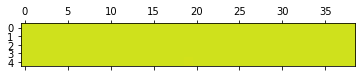

In [64]:
fig, ax = plt.subplots();
im = ax.matshow(rec_Qtab[-1]);

def update(i):
    im.set_array(rec_Qtab[20*i])
    
anim = animation.FuncAnimation(fig, update,
                               frames=2000, interval=20);

In [65]:
anim

## Draw Q Table
This is the final Q Table

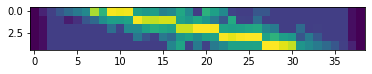

In [25]:
fig=plt.figure()
plt.imshow(driverRL.Q_table)
plt.show()

### Greedy Policy for each Pixel

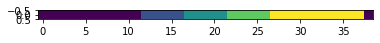

In [26]:
data=np.array([Action_from_Qtab(np.argmax(driverRL.Q_table[:,i])) for i in range(len(driverRL.Q_table[0,:]))])
plt.imshow(data.reshape(1,len(data)))
plt.show()

## Accuracy

In [18]:
res=[]
for _ in range(2000):
    env.reset()
    i=0
    while i in range(steps) and env.running:
        state=np.copy(env.state)
        action=driverRL.act(state,explore=False)
        env.take_step(action)
        i+=1
    res+=[env.running]
print('Percentage of succesful episodes:',sum(res)/len(res))

Percentage of succesful episodes: 0.637


In [19]:
print('Estimated max succes:',(1-(max_bend-max_steer-1)/max_bend)**5)

Estimated max succes: 0.6472278485082303


Estimation is based on chance that line moves more then steering can correct for the 5 times the line direction is set in episode

# Show steering angle

In [20]:
env.reset()
rec_pos=[]
rec_angle=[]
i=0
while i in range(steps) and env.running:
    state=np.copy(env.state)
    action=driverRL.act(state,explore=False)
    env.take_step(action)
    rec_pos+=[state]
    rec_angle+=[action]
    i+=1
print(env.running)

True


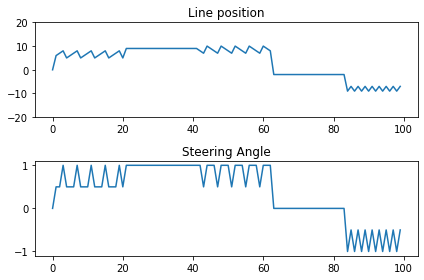

In [22]:
fig, ax = plt.subplots(2)
ax[0].set_title('Line position')
ax[0].set_ylim([-20,20])
ax[0].plot((np.array(rec_pos)-80))
ax[1].set_title('Steering Angle')
ax[1].set_ylim([-1.1,1.1])
ax[1].plot(rec_angle)
plt.tight_layout()
plt.show()